In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px

# **Task-1**

In [ ]:
df = pd.read_csv("country_vaccinations.csv")
df

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.00,0.00,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86507,Zimbabwe,ZWE,2022-03-25,8691642.0,4814582.0,3473523.0,139213.0,69579.0,57.59,31.90,23.02,4610.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
86508,Zimbabwe,ZWE,2022-03-26,8791728.0,4886242.0,3487962.0,100086.0,83429.0,58.25,32.38,23.11,5528.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
86509,Zimbabwe,ZWE,2022-03-27,8845039.0,4918147.0,3493763.0,53311.0,90629.0,58.61,32.59,23.15,6005.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...
86510,Zimbabwe,ZWE,2022-03-28,8934360.0,4975433.0,3501493.0,89321.0,100614.0,59.20,32.97,23.20,6667.0,"Oxford/AstraZeneca, Sinopharm/Beijing, Sinovac...",Ministry of Health,https://www.arcgis.com/home/webmap/viewer.html...


In [ ]:
for col in df.columns:
  print(col,"data type:", df[col].dtype)

country data type: object
iso_code data type: object
date data type: object
total_vaccinations data type: float64
people_vaccinated data type: float64
people_fully_vaccinated data type: float64
daily_vaccinations_raw data type: float64
daily_vaccinations data type: float64
total_vaccinations_per_hundred data type: float64
people_vaccinated_per_hundred data type: float64
people_fully_vaccinated_per_hundred data type: float64
daily_vaccinations_per_million data type: float64
vaccines data type: object
source_name data type: object
source_website data type: object


Number of nulls in total_vaccinations : 42905


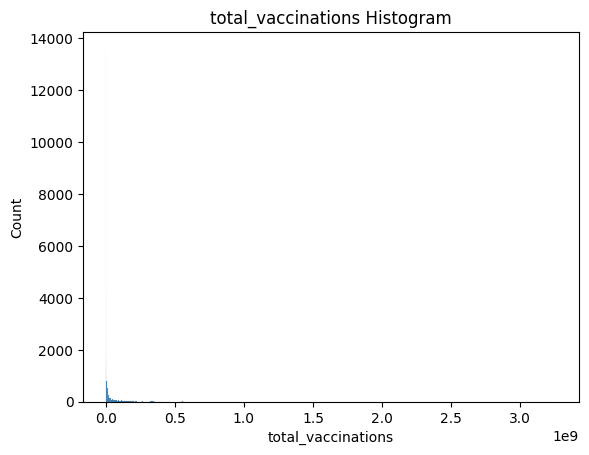

Number of nulls in people_vaccinated : 45218


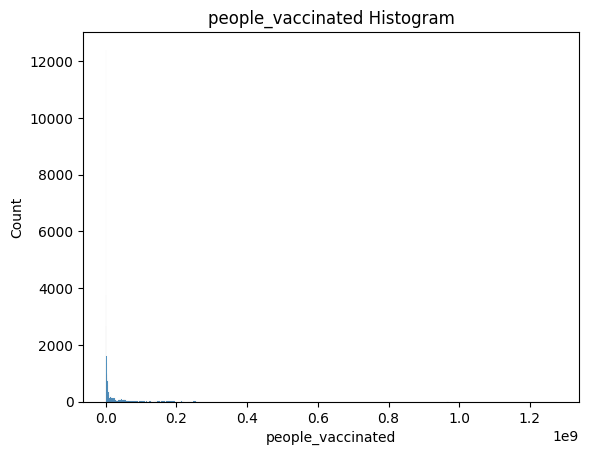

Number of nulls in people_fully_vaccinated : 47710


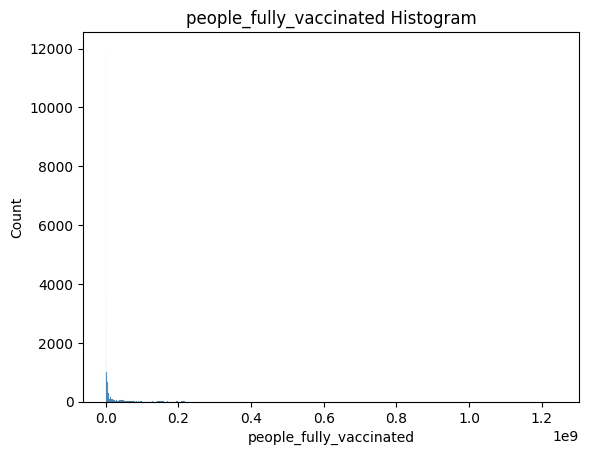

Number of nulls in daily_vaccinations_raw : 51150


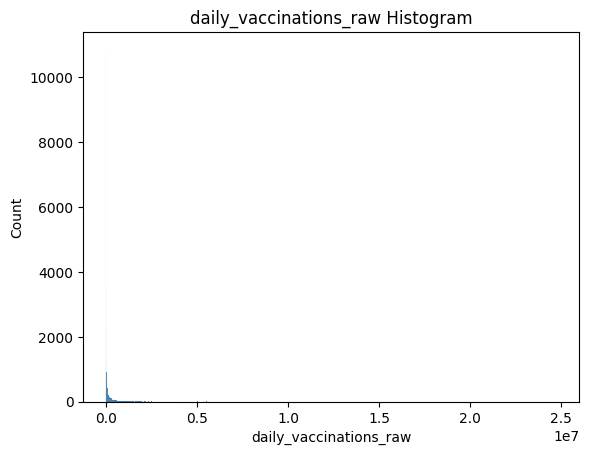

Number of nulls in daily_vaccinations : 299


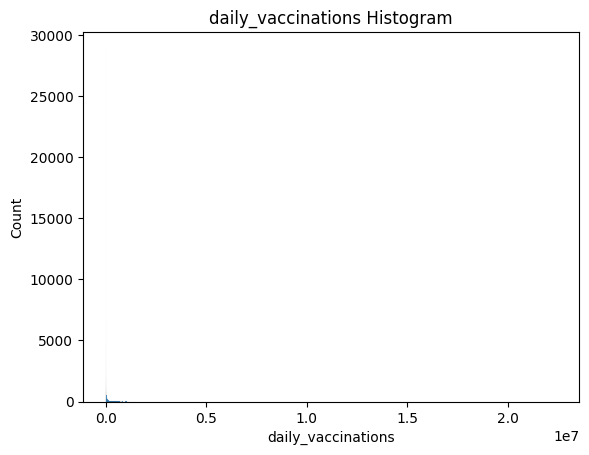

Number of nulls in total_vaccinations_per_hundred : 42905


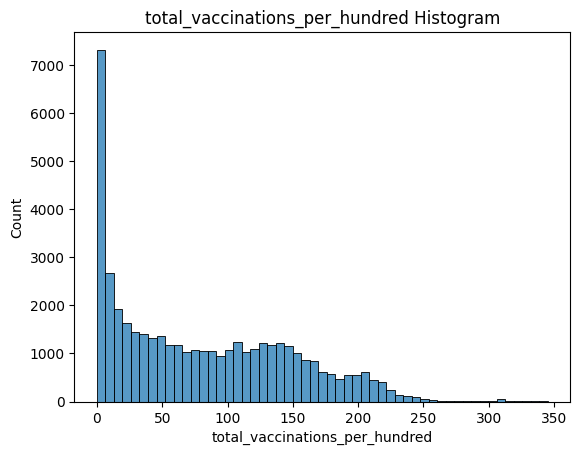

Number of nulls in people_vaccinated_per_hundred : 45218


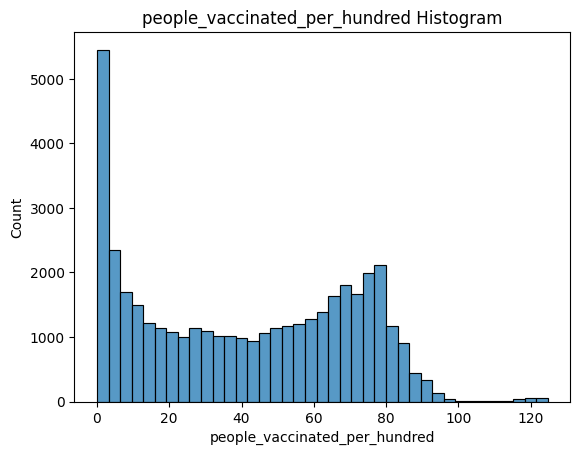

Number of nulls in people_fully_vaccinated_per_hundred : 47710


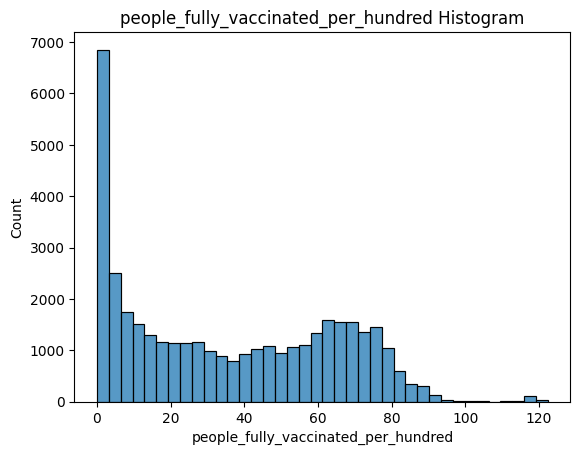

Number of nulls in daily_vaccinations_per_million : 299


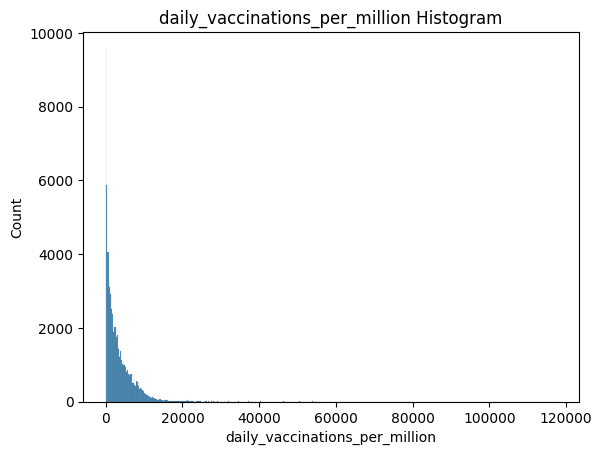

In [ ]:
for col in df.columns:
  if df[col].isna().sum()>0:
    print("Number of nulls in",col,":",df[col].isna().sum())
    sns.histplot(df[col])
    plt.title(col+" Histogram")
    plt.show()

In [ ]:
for col in df.columns:
  if df[col].isna().sum()>0:
    df[col] = df[col].fillna(df[col].median())

In [ ]:
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)
   IQR=q3-q1
   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

def impute_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   upper = df[~(df>(q3+1.5*IQR))].max()

   lower = df[~(df<(q1-1.5*IQR))].min()

   df = np.where(df > upper,

       df.mean(),

       np.where(

           df < lower,

           df.mean(),

           df

           )

       )


   return pd.Series(df)

In [ ]:
for col in df.columns:
  if df[col].dtype == 'float64' or df[col].dtype == 'int':
    outliers=find_outliers_IQR(df[col])
    print('Number of outliers in '+ col + ": ", len(outliers))

Number of outliers in total_vaccinations:  42206
Number of outliers in people_vaccinated:  41294
Number of outliers in people_fully_vaccinated:  38802
Number of outliers in daily_vaccinations_raw:  35362
Number of outliers in daily_vaccinations:  13200
Number of outliers in total_vaccinations_per_hundred:  42114
Number of outliers in people_vaccinated_per_hundred:  41294
Number of outliers in people_fully_vaccinated_per_hundred:  38797
Number of outliers in daily_vaccinations_per_million:  3395


In [ ]:
for col in df.columns:
  if df[col].dtype == 'float64' or df[col].dtype == 'int':
    df[col] = impute_outliers_IQR(df[col])

In [ ]:
group_data = df.groupby('date')['total_vaccinations'].sum()
fig = px.line(group_data, x=group_data.index, y=group_data.values, title='Vaccinations Trend Over Time Globally')
fig.update_yaxes(title="Total vaccinations")
fig.show()

In [ ]:
group_data = df.groupby('country')['total_vaccinations'].sum()
top = group_data.sort_values(ascending=False).head(10)
fig = px.bar(top,x=top.index,y=top.values,title="Top Ten Performing Countries",color=top.index)
fig.update_yaxes(title="Total vaccinations")
fig.show()

In [ ]:
countries = list(df['country'].unique())
for country in countries:
  fig = px.line(df[df['country']==country],x='date',y='total_vaccinations',title='Vaccination Trends in '+country+' Over Time')
  fig.show()

In [ ]:
vaccine_lists = df['vaccines'].str.split(',')
all_vaccines = [vaccine for vaccines_list in vaccine_lists for vaccine in vaccines_list]
fig = px.histogram(all_vaccines,color=all_vaccines,labels={'x': 'Vaccine Name'}, title='Distribution of Vaccine Types')
fig.update_xaxes(title="vaccinations")
fig.show()

# **Task-2**

In [ ]:
# List of encodings to try
encodings = ['utf-8', 'latin1', 'ISO-8859-1', 'cp1252']

# Loop through each encoding and try reading the CSV file
for encoding in encodings:
    try:
        df = pd.read_csv("zomato.csv", encoding=encoding)
        print("File read successfully with encoding:", encoding)
        break  # Break out of the loop if the file is read successfully
    except UnicodeDecodeError:
        print("Failed to read file with encoding:", encoding)
df

Failed to read file with encoding: utf-8
File read successfully with encoding: latin1


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [ ]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [ ]:
for col in df.columns:
  if df[col].isna().sum()>0:
    print("Number of nulls in",col,":",df[col].isna().sum())
    sns.histplot(df[col])
    plt.title(col+" Histogram")
    plt.show()

In [ ]:
df['Cuisines']=df['Cuisines'].fillna(df['Cuisines'].mode()).loc[0]

In [ ]:
for col in df.columns:
  print(col,"data type:", df[col].dtype)

Restaurant ID data type: int64
Restaurant Name data type: object
Country Code data type: int64
City data type: object
Address data type: object
Locality data type: object
Locality Verbose data type: object
Longitude data type: float64
Latitude data type: float64
Cuisines data type: object
Average Cost for two data type: int64
Currency data type: object
Has Table booking data type: object
Has Online delivery data type: object
Is delivering now data type: object
Switch to order menu data type: object
Price range data type: int64
Aggregate rating data type: float64
Rating color data type: object
Rating text data type: object
Votes data type: int64


In [ ]:
df['Price range'].unique()

array([3, 4, 2, 1])

In [ ]:
import spacy
import ipywidgets as widgets
from IPython.display import display,clear_output
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

In [ ]:
class Restaurant:
    def __init__(self, name, address, cuisine, price_range, rating, delivery_option):
        self.name = name
        self.address = address
        self.cuisine = cuisine
        self.price_range = price_range
        self.rating = rating
        self.delivery_option = delivery_option


In [ ]:
class Chatbot:
    def __init__(self):
        self.restaurants = []  # Store restaurant data in this list
        self.cuisine_vectorizer = TfidfVectorizer(stop_words='english')
        self.price_range_vectorizer = TfidfVectorizer(stop_words='english')
        self.delivery_vectorizer = TfidfVectorizer(stop_words='english')
        self.restaurant_data = None

    def add_restaurant(self, name, address, cuisine, price_range, rating, delivery_option):
        self.restaurants.append(Restaurant(name, address, cuisine, price_range, rating, delivery_option))

    def prepare_data(self):
        # Prepare data for content-based filtering
        self.restaurant_data = {
            'name': [restaurant.name for restaurant in self.restaurants],
            'cuisine': [restaurant.cuisine for restaurant in self.restaurants],
            'price_range': [restaurant.price_range for restaurant in self.restaurants],
            'delivery_option': [restaurant.delivery_option for restaurant in self.restaurants],
        }
        # Create feature vectors for each restaurant attribute
        cuisine_vectors = self.cuisine_vectorizer.fit_transform(self.restaurant_data['cuisine'])
        price_range_vectors = self.price_range_vectorizer.fit_transform(self.restaurant_data['price_range'])
        delivery_vectors = self.delivery_vectorizer.fit_transform(self.restaurant_data['delivery_option'])
        # Combine feature vectors for all attributes
        self.restaurant_vectors = np.hstack([cuisine_vectors.toarray(), price_range_vectors.toarray(), delivery_vectors.toarray()])

    def get_recommendations(self, cuisine_preference, price_range_preference, delivery_preference):
        # Transform user preferences to feature vectors
        user_cuisine_vector = self.cuisine_vectorizer.transform([cuisine_preference])
        user_price_range_vector = self.price_range_vectorizer.transform([price_range_preference])
        user_delivery_vector = self.delivery_vectorizer.transform([delivery_preference])
        # Combine user preference feature vectors
        user_vector = np.hstack([user_cuisine_vector.toarray(), user_price_range_vector.toarray(), user_delivery_vector.toarray()])

        # Calculate cosine similarity between user preference and restaurant data
        cosine_similarities = linear_kernel(user_vector, self.restaurant_vectors).flatten()

        # Get indices of top 3 most similar restaurants
        top_indices = cosine_similarities.argsort()[:-4:-1]

        # Return the top 3 recommended restaurants
        recommendations = [self.restaurants[i] for i in top_indices]
        return recommendations


In [ ]:
def main():
    chatbot = Chatbot()

    # For demonstration purposes, let's add some example restaurant data
    chatbot.add_restaurant("Restaurant A", "123 Main St", "Italian", "$$$", 4.5, "Yes")
    chatbot.add_restaurant("Restaurant B", "456 Elm St", "Indian", "$$", 4.2, "No")
    chatbot.add_restaurant("Restaurant C", "789 Oak St", "Chinese", "$", 3.8, "Yes")

    # Prepare data for content-based filtering
    chatbot.prepare_data()

    print("Welcome to the Restaurant Recommendation Chatbot!")
    print("Please enter your cuisine preference (e.g., Italian, Indian, Chinese):")
    cuisine_preference = input()

    print("Please enter your price range preference (e.g., $, $$, $$$):")
    price_range_preference = input()

    print("Do you prefer restaurants with delivery options? (Yes/No):")
    delivery_preference = input()

    recommendations = chatbot.get_recommendations(cuisine_preference, price_range_preference, delivery_preference)

    if recommendations:
        print("Here are some recommended restaurants:")
        for restaurant in recommendations:
            print(f"Name: {restaurant.name}")
            print(f"Address: {restaurant.address}")
            print(f"Cuisine: {restaurant.cuisine}")
            print(f"Price Range: {restaurant.price_range}")
            print(f"Rating: {restaurant.rating}")
            print(f"Delivery Option: {restaurant.delivery_option}")
            print("--------------------")
    else:
        print("Sorry, no restaurants found matching your preferences.")

if __name__ == "__main__":
    main()